### Silver to Gold Medallion Layer: Merging Data Sources

In [1]:
import sys
sys.path.append("..")

In [2]:
from snowflake.snowpark import Session
from snowflake.snowpark.functions import when, col, count, sum
from datetime import date
from helpers import SnowflakeHelper
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import bar_chart_race as bcr
import ffmpeg
import matplotlib.animation as animation
from IPython.display import HTML

In [3]:
null_value_mapping = {
    "(null)" : None,
    "NaN" : None,
    "(" : None,
    "NULL": None,
    "(nu": None, 
    "#N/A": None
}

officer_mapping = {
    'LT ': 'LT',
    'DI ': 'DI'
}

In [4]:
snowflake_helper = SnowflakeHelper("SAFEGUARDING_NYC_SCHEMA_SILVER")
snowflake_config = './../helpers/snowflake_config.json'
session = snowflake_helper.create_snowpark_session(snowflake_config)

[INFO] Using the schema SAFEGUARDING_NYC_SCHEMA_SILVER for the session
[SUCCESS] Config file loaded successfully!
[SUCCESS] Snowspark Session created successfully on schema SAFEGUARDING_NYC_SCHEMA_SILVER!


## Extracting Data

In [5]:
use_of_force_data = session.table('SAFEGUARDING_NYC_SCHEMA_GOLD.USE_OF_FORCE_COMBINED')
sqf_data = session.table('SQF_DATA')
shooting_incidents_data = session.table('SHOOTING_INCIDENTS')

In [6]:
use_of_force_data.show()

-----------------------------------------------------------------------------------------------------------------------------------------------------------------------
|"FORCETYPE"        |"INCIDENT PCT"  |"TRI INCIDENT NUMBER"  |"PATROL BOROUGH"  |"OCCURRENCE DATE"  |"FORCE AGAINST MOS"  |"AGE"  |"SUBJECT GENDER"  |"SUBJECT RACE"  |
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------
|Physical Force     |1               |2020020962067          |MANHATTAN         |2020-05-06         |Physical Force       |NULL   |MALE              |BLACK           |
|Physical Force     |1               |2020020962143          |MANHATTAN         |2020-10-11         |Physical Force       |NULL   |MALE              |BLACK           |
|Physical Force     |5               |2020024962080          |MANHATTAN         |2020-06-30         |Physical Force       |NULL   |MALE              |BLACK     

In [7]:
sqf_data.show()

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [8]:
shooting_incidents_data.show()

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|"OCCUR_DATE"  |"OCCUR_TIME"  |"INCIDENT_KEY"  |"LATITUDE"   |"STATISTICAL_MURDER_FLAG"  |"LONGITUDE"   |"BORO"     |"LOCATION_DESC"            |"PRECINCT"  |"PERP_AGE_GROUP"  |"VIC_AGE_GROUP"  |"VIC_RACE"      |"PERP_RACE"     |"PERP_SEX"  |"VIC_SEX"  |
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
|2007-05-04    |19:13:00      |28832628        |40.70370632  |FALSE                      |-73.94325706  |BROOKLYN   |MULTI DWELL - PUBLIC HOUS  |90          |<18               |<18              |BLACK           |BLACK           |MALE  

In [9]:
sqf_df = sqf_data.toPandas()
sqf_df.head(5)

,STOP_ID,STOP_FRISK_TIME,SUPERVISING_ACTION_CORRESPONDING_ACTIVITY_LOG_ENTRY_REVIEWED,SUSPECT_WEIGHT,STOP_LOCATION_SECTOR_CODE,STOP_LOCATION_STREET_NAME,STOP_DURATION_MINUTES,SUSPECT_SEX,ASK_FOR_CONSENT_FLG,STOP_LOCATION_X,...,SEARCH_BASIS_OUTLINE_FLAG,ISSUING_OFFICER_RANK,OFFICER_EXPLAINED_STOP_FLAG,STOP_LOCATION_PRECINCT,SUSPECT_OTHER_DESCRIPTION,STOP_LOCATION_PATROL_BORO_NAME,STOP_LOCATION_BORO_NAME,YEAR2,SUSPECT_RACE_DESCRIPTION,STOP_FRISK_DATE
0,1,01:50:00,Y,200,B,JENNINGS ST,2,MALE,N,1013737,...,None,SGT,Y,042,None,BRONX,BRONX,2021,BLACK,2021-01-01
1,2,10:55:00,Y,160,B,219 ST,10,MALE,N,1052511,...,None,POM,Y,105,NA,QUEENS,QUEENS,2021,BLACK,2021-01-01
2,3,10:10:00,N,None,A,151 AVE,1,MALE,None,1025662,...,None,POM,Y,106,YELLOW SWEATER,QUEENS,QUEENS,2021,ASIAN/PACIFIC ISLANDER,2021-01-01
3,4,20:17:00,Y,180,A,BROADWAY,5,MALE,Y,1010122,...,None,POM,Y,073,None,BROOKLYN,BROOKLYN,2021,BLACK,2021-01-01
4,5,19:59:00,Y,185,C,W 125 ST,30,MALE,N,996623,...,None,POM,Y,026,UNKNOWN,MANHATTAN,MANHATTAN,2021,BLACK,2021-01-01


In [10]:
sqf_df = sqf_df.replace(null_value_mapping)
sqf_df

,STOP_ID,STOP_FRISK_TIME,SUPERVISING_ACTION_CORRESPONDING_ACTIVITY_LOG_ENTRY_REVIEWED,SUSPECT_WEIGHT,STOP_LOCATION_SECTOR_CODE,STOP_LOCATION_STREET_NAME,STOP_DURATION_MINUTES,SUSPECT_SEX,ASK_FOR_CONSENT_FLG,STOP_LOCATION_X,...,SEARCH_BASIS_OUTLINE_FLAG,ISSUING_OFFICER_RANK,OFFICER_EXPLAINED_STOP_FLAG,STOP_LOCATION_PRECINCT,SUSPECT_OTHER_DESCRIPTION,STOP_LOCATION_PATROL_BORO_NAME,STOP_LOCATION_BORO_NAME,YEAR2,SUSPECT_RACE_DESCRIPTION,STOP_FRISK_DATE
0,1,01:50:00,Y,200,B,JENNINGS ST,2,MALE,N,1013737,...,None,SGT,Y,042,None,BRONX,BRONX,2021,BLACK,2021-01-01
1,2,10:55:00,Y,160,B,219 ST,10,MALE,N,1052511,...,None,POM,Y,105,NA,QUEENS,QUEENS,2021,BLACK,2021-01-01
2,3,10:10:00,N,None,A,151 AVE,1,MALE,None,1025662,...,None,POM,Y,106,YELLOW SWEATER,QUEENS,QUEENS,2021,ASIAN/PACIFIC ISLANDER,2021-01-01
3,4,20:17:00,Y,180,A,BROADWAY,5,MALE,Y,1010122,...,None,POM,Y,073,None,BROOKLYN,BROOKLYN,2021,BLACK,2021-01-01
4,5,19:59:00,Y,185,C,W 125 ST,30,MALE,N,996623,...,None,POM,Y,026,UNKNOWN,MANHATTAN,MANHATTAN,2021,BLACK,2021-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69252,None,23:45:00,None,160,C,EAST TREMONT AVENUE,2,MALE,Y,1015559,...,None,POM,Y,48,N/A,BRONX,BRONX,2019,BLACK,2019-03-06
69253,None,23:45:00,None,160,C,EAST TREMONT AVENUE,2,MALE,Y,1015559,...,None,POM,Y,48,NONE,BRONX,BRONX,2019,BLACK,2019-03-07
69254,None,16:20:00,None,150,A,FORDHAM PLAZA,9,MALE,Y,1014657,...,None,POM,Y,48,N/A,BRONX,BRONX,2019,BLACK HISPANIC,2019-03-08
69255,None,0:20:00,None,200,C,ELSMERE PLACE,30,MALE,N,1015655,...,Y,POM,Y,48,None,BRONX,BRONX,2019,BLACK,2019-03-12


In [11]:
sqf_df['SUPERVISING_OFFICER_RANK'] = sqf_df['SUPERVISING_OFFICER_RANK'].replace(officer_mapping)
sqf_df['SUPERVISING_OFFICER_RANK'].value_counts().index

Index(['SGT', 'LT', 'SSA', 'LSA', 'CPT', 'DI', 'POM', 'SDS', 'LCD', 'POF',
       'INS', 'DTS', 'DT3'],
      dtype='object', name='SUPERVISING_OFFICER_RANK')

In [12]:
sqf_df['STOP_FRISK_TIME'] = pd.to_datetime(sqf_df['STOP_FRISK_TIME'])
sqf_df['STOP_FRISK_HOUR'] = sqf_df['STOP_FRISK_TIME'].apply(lambda x: x.hour)
sqf_df['STOP_FRISK_HOUR']

/var/folders/7b/79wqm1gs4qx4b_4mdnfyf4kh0000gn/T/ipykernel_67470/1339669683.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  sqf_df['STOP_FRISK_TIME'] = pd.to_datetime(sqf_df['STOP_FRISK_TIME'])


0         1.0
1        10.0
2        10.0
3        20.0
4        19.0
         ... 
69252    23.0
69253    23.0
69254    16.0
69255     0.0
69256     1.0
Name: STOP_FRISK_HOUR, Length: 69257, dtype: float64

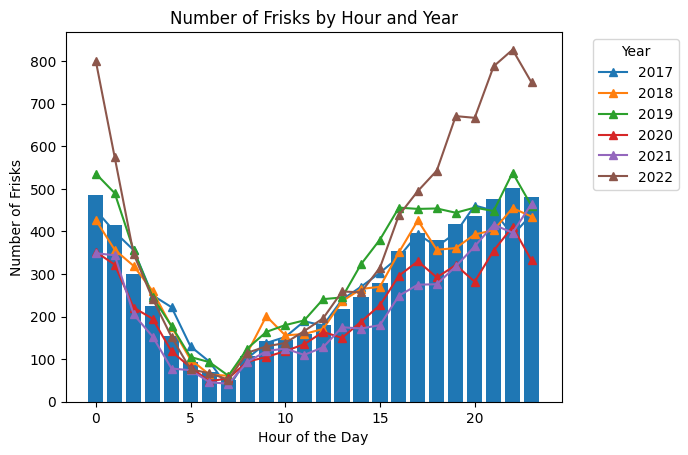

In [13]:
frisk_df = sqf_df[sqf_df['FRISKED_FLAG'] == 'Y']
grouped_df = frisk_df.groupby(['STOP_FRISK_HOUR', 'YEAR2']).size().unstack()
grouped_df['Mean'] = grouped_df.iloc[:, :].mean(axis=1)

for year in grouped_df.columns[:-1]:
    plt.plot(grouped_df.index, grouped_df[year], label=str(year), marker='^')

#plt.plot(grouped_df.index, grouped_df['Mean'], label='Mean', marker='o')
plt.bar(grouped_df.index, grouped_df['Mean'])
# Customize the plot
plt.title('Number of Frisks by Hour and Year')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Frisks')
plt.legend(title='Year', bbox_to_anchor=(1.25, 1), loc='upper right')
plt.show()

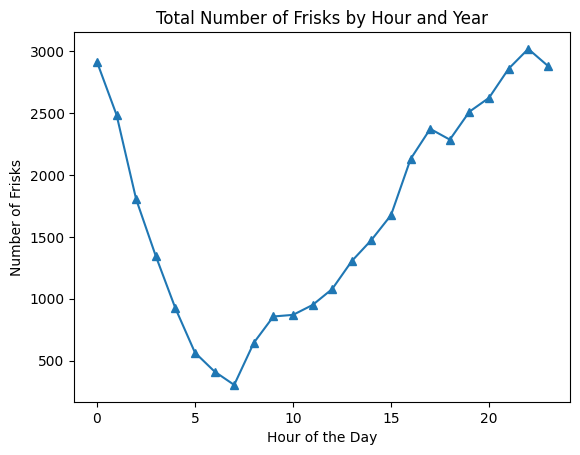

In [14]:
grouped_df = frisk_df.groupby(['STOP_FRISK_HOUR']).size()

plt.plot(grouped_df.index, grouped_df[0:], marker='^')


# Customize the plot
plt.title('Total Number of Frisks by Hour and Year')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Frisks')
plt.show()

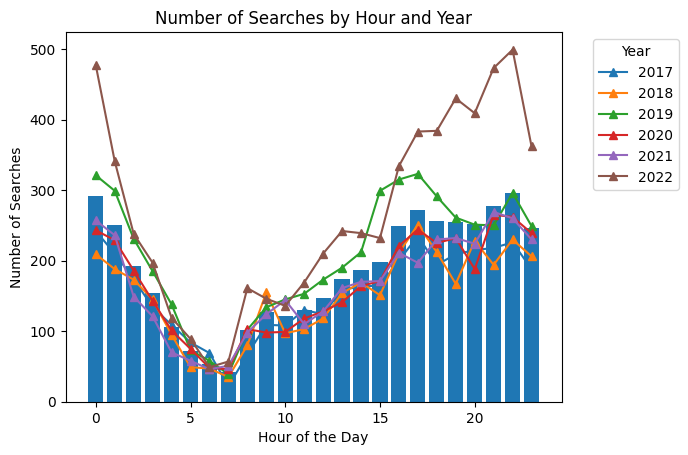

In [15]:
search_df = sqf_df[sqf_df['SEARCHED_FLAG'] == 'Y']
grouped_df = search_df.groupby(['STOP_FRISK_HOUR', 'YEAR2']).size().unstack()
grouped_df['Mean'] = grouped_df.iloc[:, :].mean(axis=1)

for year in grouped_df.columns[:-1]:
    plt.plot(grouped_df.index, grouped_df[year], label=str(year), marker='^')

#plt.plot(grouped_df.index, grouped_df['Mean'], label='Mean', marker='o')
plt.bar(grouped_df.index, grouped_df['Mean'])
# Customize the plot
plt.title('Number of Searches by Hour and Year')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Searches')
plt.legend(title='Year', bbox_to_anchor=(1.25, 1), loc='upper right')
plt.show()

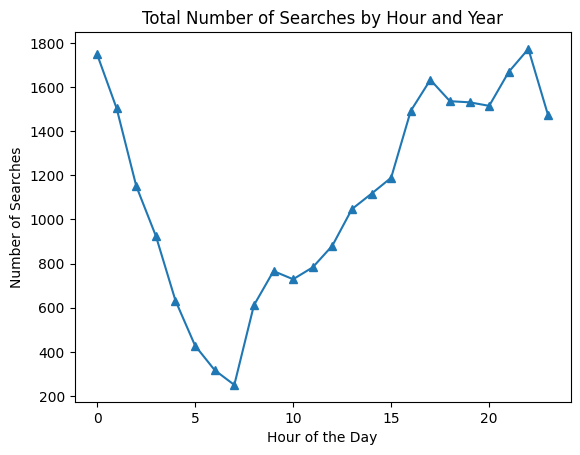

In [16]:
grouped_df = search_df.groupby(['STOP_FRISK_HOUR']).size()

plt.plot(grouped_df.index, grouped_df[0:], marker='^')


# Customize the plot
plt.title('Total Number of Searches by Hour and Year')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Searches')
plt.show()

MovieWriter ffmpeg unavailable; using Pillow instead.


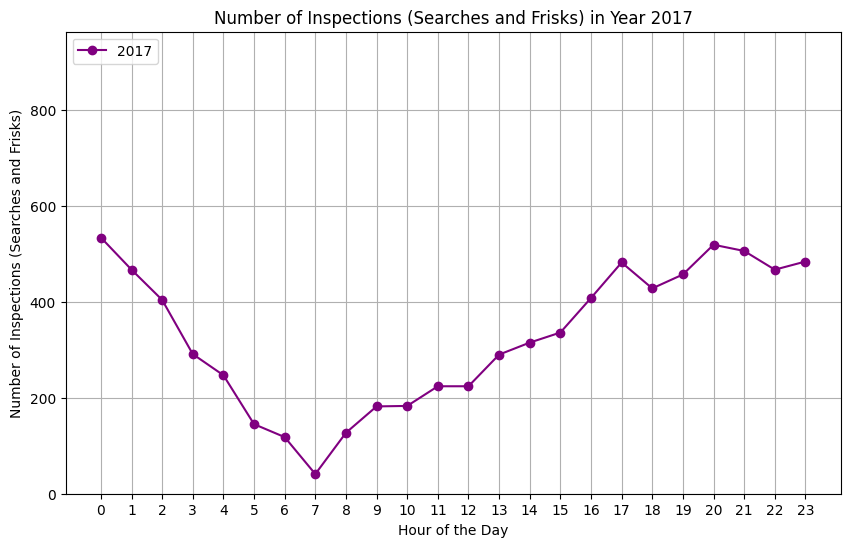

In [17]:
search_and_frisk_df = sqf_df[(sqf_df['SEARCHED_FLAG'] == 'Y') | (sqf_df['FRISKED_FLAG'] == 'Y')]
grouped_df = search_and_frisk_df.groupby(['STOP_FRISK_HOUR', 'YEAR2']).size().unstack()

# Setup the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Determine the number of frames for smoother animation
num_frames = len(grouped_df.columns) * 20  # Increase the multiplier for smoother transitions

def animate(frame):
    year_index = frame // 20  # Adjust this divisor to match the number of frames per year
    ax.clear()
    ax.plot(grouped_df.index, grouped_df.iloc[:, year_index], label=str(grouped_df.columns[year_index]), marker='o', color='purple', animated=True)
    ax.set_title('Number of Inspections (Searches and Frisks) in Year ' + str(grouped_df.columns[year_index]))
    ax.set_xlabel('Hour of the Day')
    ax.set_ylabel('Number of Inspections (Searches and Frisks)')
    ax.legend(loc='upper left')
    ax.grid(True) 
    ax.set_xticks(range(0, 24))
    ax.set_ylim([0, max(grouped_df.max())]) 

ani = animation.FuncAnimation(fig, animate, frames=num_frames, interval=50) 
ani.save('./../images/search_and_frisk_over_years_2017_to_2022.gif')
HTML(ani.to_jshtml())


In [18]:
shooting_incidents_df = shooting_incidents_data.toPandas()
shooting_incidents_df.head()

,OCCUR_DATE,OCCUR_TIME,INCIDENT_KEY,LATITUDE,STATISTICAL_MURDER_FLAG,LONGITUDE,BORO,LOCATION_DESC,PRECINCT,PERP_AGE_GROUP,VIC_AGE_GROUP,VIC_RACE,PERP_RACE,PERP_SEX,VIC_SEX
0,2021-05-27,21:30:00,228798151,40.66296462,FALSE,-73.73083869,QUEENS,None,105,None,18-24,BLACK,None,None,MALE
1,2014-06-27,17:40:00,137471050,40.81035186,FALSE,-73.92494233,BRONX,None,40,None,18-24,BLACK,None,None,MALE
2,2015-11-21,3:56:00,147998800,40.74260663,TRUE,-73.91549174,QUEENS,None,108,None,25-44,WHITE,None,None,MALE
3,2015-10-09,18:30:00,146837977,40.837782,FALSE,-73.91945661,BRONX,None,44,None,<18,WHITE HISPANIC,None,None,MALE
4,2009-02-19,22:58:00,58921844,40.88623792,TRUE,-73.85290951,BRONX,None,47,25-44,45-64,BLACK,BLACK,MALE,MALE


In [19]:
shooting_incidents_df['OCCUR_TIME'] = pd.to_datetime(shooting_incidents_df['OCCUR_TIME'], format='%H:%M:%S', errors='coerce')
shooting_incidents_df['OCCUR_DATE'] = pd.to_datetime(shooting_incidents_df['OCCUR_DATE'], format="%d/%m/%Y", errors='coerce')
shooting_incidents_df['OCCUR_HOUR'] = shooting_incidents_df['OCCUR_TIME'].apply(lambda x: x.hour)
shooting_incidents_df['OCCUR_YEAR'] = shooting_incidents_df['OCCUR_DATE'].apply(lambda x: x.year)
shooting_incidents_df.head()

,OCCUR_DATE,OCCUR_TIME,INCIDENT_KEY,LATITUDE,STATISTICAL_MURDER_FLAG,LONGITUDE,BORO,LOCATION_DESC,PRECINCT,PERP_AGE_GROUP,VIC_AGE_GROUP,VIC_RACE,PERP_RACE,PERP_SEX,VIC_SEX,OCCUR_HOUR,OCCUR_YEAR
0,2021-05-27,1900-01-01 21:30:00,228798151,40.66296462,FALSE,-73.73083869,QUEENS,None,105,None,18-24,BLACK,None,None,MALE,21,2021
1,2014-06-27,1900-01-01 17:40:00,137471050,40.81035186,FALSE,-73.92494233,BRONX,None,40,None,18-24,BLACK,None,None,MALE,17,2014
2,2015-11-21,1900-01-01 03:56:00,147998800,40.74260663,TRUE,-73.91549174,QUEENS,None,108,None,25-44,WHITE,None,None,MALE,3,2015
3,2015-10-09,1900-01-01 18:30:00,146837977,40.837782,FALSE,-73.91945661,BRONX,None,44,None,<18,WHITE HISPANIC,None,None,MALE,18,2015
4,2009-02-19,1900-01-01 22:58:00,58921844,40.88623792,TRUE,-73.85290951,BRONX,None,47,25-44,45-64,BLACK,BLACK,MALE,MALE,22,2009


MovieWriter ffmpeg unavailable; using Pillow instead.


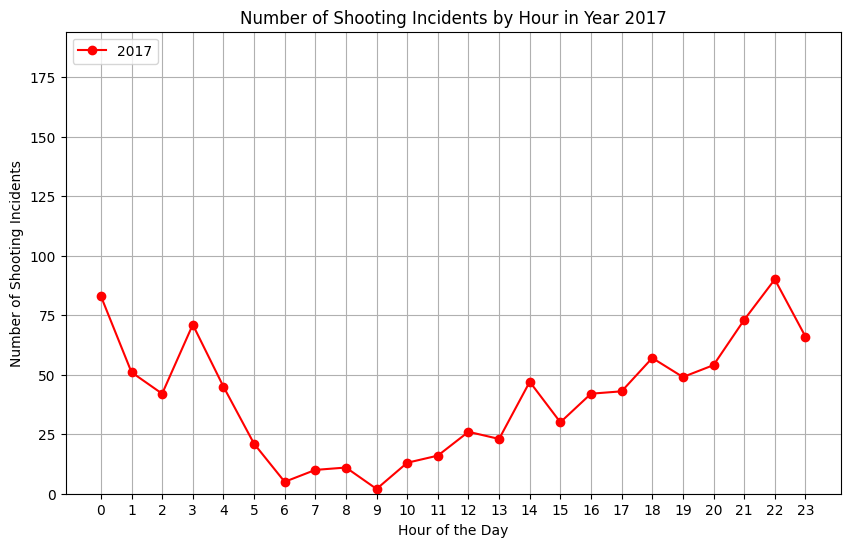

In [20]:
filtered_data = shooting_incidents_df[(shooting_incidents_df['OCCUR_YEAR'] >= 2017) & (shooting_incidents_df['OCCUR_YEAR'] <= 2022)]

grouped_df = filtered_data.groupby(['OCCUR_HOUR', 'OCCUR_YEAR']).size().unstack()

# Setup the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Determine the number of frames for smoother animation
num_frames = len(grouped_df.columns) * 20  # Increase the multiplier for smoother transitions

def animate(frame):
    year_index = frame // 20  # Adjust this divisor to match the number of frames per year
    ax.clear()
    ax.plot(grouped_df.index, grouped_df.iloc[:, year_index], label=str(grouped_df.columns[year_index]), marker='o', color='red', animated=True)
    ax.set_title('Number of Shooting Incidents by Hour in Year ' + str(grouped_df.columns[year_index]))
    ax.set_xlabel('Hour of the Day')
    ax.set_ylabel('Number of Shooting Incidents')
    ax.legend(loc='upper left')
    ax.grid(True) 
    ax.set_xticks(range(0, 24))
    ax.set_ylim([0, max(grouped_df.max())]) 

ani = animation.FuncAnimation(fig, animate, frames=num_frames, interval=50) 
ani.save('./../images/shooting_incidents_over_years_2017_to_2022.gif')

HTML(ani.to_jshtml())

In [21]:
search_and_frisk_df = sqf_df[(sqf_df['SEARCHED_FLAG'] == 'Y') | (sqf_df['FRISKED_FLAG'] == 'Y')]
grouped_df = search_and_frisk_df.groupby(['STOP_FRISK_HOUR', 'YEAR2']).size().unstack()
grouped_df['Mean'] = grouped_df.iloc[:, :].mean(axis=1)
#plt.plot(grouped_df.index, grouped_df['Mean'], marker='^')
grouped_df

YEAR2,2017,2018,2019,2020,2021,2022,Mean
STOP_FRISK_HOUR,,,,,,,
0.0,534,486,621,410,424,929,567.333333
1.0,467,412,582,391,417,670,489.833333
2.0,404,363,427,294,257,426,361.833333
3.0,291,303,324,242,198,318,279.333333
4.0,247,208,235,163,107,206,194.333333
5.0,145,114,139,113,97,127,122.500000
6.0,118,79,111,75,66,86,89.166667
7.0,41,70,70,74,71,86,68.666667
8.0,127,144,159,135,141,206,152.000000


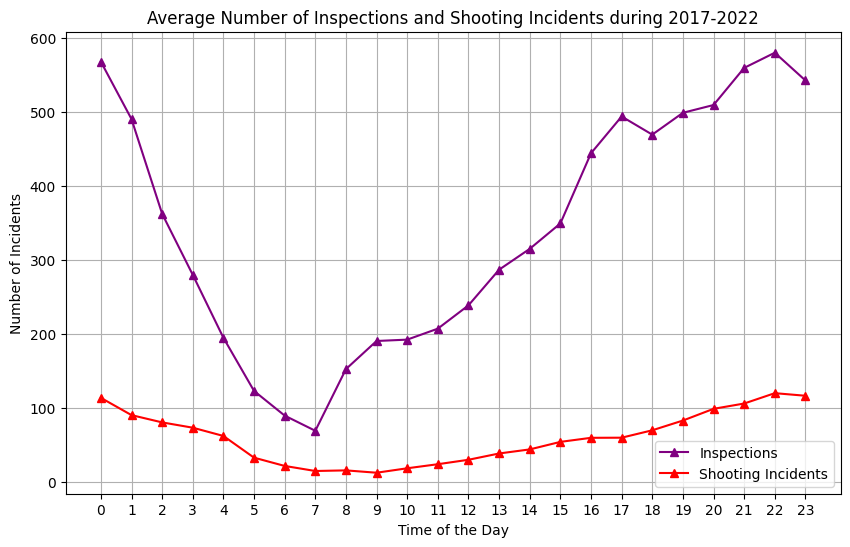

In [22]:
search_and_frisk_df = sqf_df[(sqf_df['SEARCHED_FLAG'] == 'Y') | (sqf_df['FRISKED_FLAG'] == 'Y')]
grouped_sqf_df = search_and_frisk_df.groupby(['STOP_FRISK_HOUR', 'YEAR2']).size().unstack()
grouped_sqf_df['Mean'] = grouped_sqf_df.iloc[:, :].mean(axis=1)

filtered_data = shooting_incidents_df[(shooting_incidents_df['OCCUR_YEAR'] >= 2017) & (shooting_incidents_df['OCCUR_YEAR'] <= 2022)]
grouped_si_df = filtered_data.groupby(['OCCUR_HOUR', 'OCCUR_YEAR']).size().unstack()
grouped_si_df['Mean'] = grouped_si_df.iloc[:, :].mean(axis=1)

fig, ax = plt.subplots(figsize=(10, 6))
plt.plot(grouped_sqf_df.index, grouped_sqf_df['Mean'], marker='^', color='purple',label= 'Inspections')
plt.plot(grouped_si_df.index, grouped_si_df['Mean'], marker='^', color='red', label= 'Shooting Incidents')


plt.legend(loc='upper left')
plt.grid(True) 
plt.xticks(range(0, 24))
plt.title('Average Number of Inspections and Shooting Incidents during 2017-2022')
plt.xlabel('Time of the Day')
plt.ylabel('Number of Incidents')
plt.legend(loc='lower right')
plt.show()

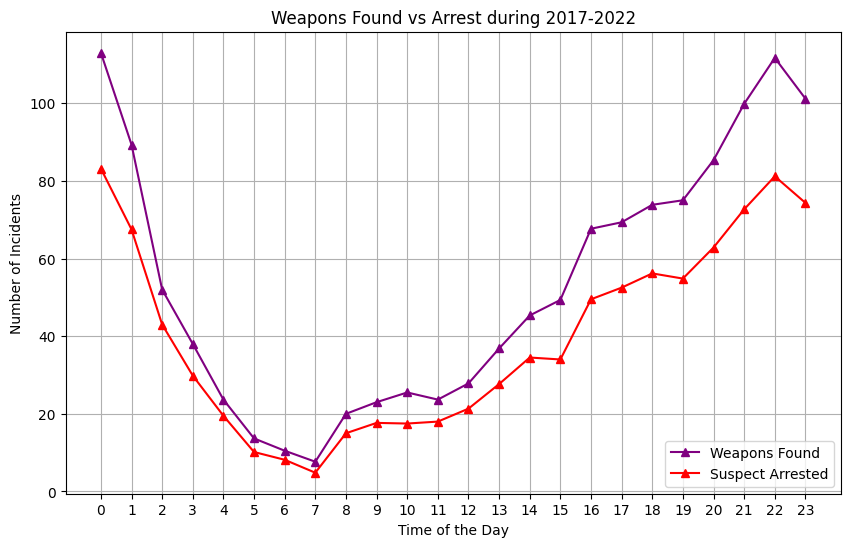

In [23]:
search_and_frisk_df = sqf_df[(sqf_df['SEARCHED_FLAG'] == 'Y') | (sqf_df['FRISKED_FLAG'] == 'Y')]
filtered_data_weapons_found = search_and_frisk_df[(search_and_frisk_df['WEAPON_FOUND_FLAG'] == 'Y')]
grouped_weapons_df = filtered_data_weapons_found.groupby(['STOP_FRISK_HOUR', 'YEAR2']).size().unstack()
grouped_weapons_df['Mean'] = grouped_weapons_df.iloc[:, :].mean(axis=1)

filtered_data_arrest_suspect = search_and_frisk_df[(search_and_frisk_df['WEAPON_FOUND_FLAG'] == 'Y') & (search_and_frisk_df['SUSPECT_ARRESTED_FLAG'] == 'Y')]
grouped_arrest_df = filtered_data_arrest_suspect.groupby(['STOP_FRISK_HOUR', 'YEAR2']).size().unstack()
grouped_arrest_df['Mean'] = grouped_arrest_df.iloc[:, :].mean(axis=1)

fig, ax = plt.subplots(figsize=(10, 6))
plt.plot(grouped_weapons_df.index, grouped_weapons_df['Mean'], marker='^', color='purple',label= 'Weapons Found')
plt.plot(grouped_arrest_df.index, grouped_arrest_df['Mean'], marker='^', color='red', label= 'Suspect Arrested')


plt.legend(loc='upper left')
plt.grid(True) 
plt.xticks(range(0, 24))
plt.title('Weapons Found vs Arrest during 2017-2022')
plt.xlabel('Time of the Day')
plt.ylabel('Number of Incidents')
plt.legend(loc='lower right')
plt.show()

/var/folders/7b/79wqm1gs4qx4b_4mdnfyf4kh0000gn/T/ipykernel_67470/2404396142.py:12: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  centre_circle = plt.Circle((0, 0), 0.6, color='white', edgecolor='black', linewidth=0.8)


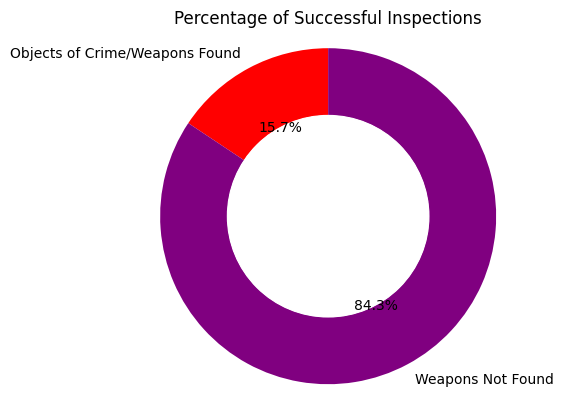

In [24]:
weapons_found_percent = (len(filtered_data_weapons_found) / len(search_and_frisk_df)) * 100
weapons_not_found_percent = 100 - weapons_found_percent

labels = ['Objects of Crime/Weapons Found', 'Weapons Not Found']
sizes = [weapons_found_percent, weapons_not_found_percent]
colors = ['red', 'purple']

fig, ax = plt.subplots()
ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors, wedgeprops=dict(width=0.4))

# Draw a white circle to create a donut chart
centre_circle = plt.Circle((0, 0), 0.6, color='white', edgecolor='black', linewidth=0.8)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that the pie is drawn as a circle
ax.axis('equal')

plt.title('Percentage of Successful Inspections')
plt.show()

In [25]:
total_incidents = len(filtered_data_weapons_found)
total_incidents

7699

/var/folders/7b/79wqm1gs4qx4b_4mdnfyf4kh0000gn/T/ipykernel_67470/3036754296.py:12: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  centre_circle = plt.Circle((0, 0), 0.6, color='white', edgecolor='black', linewidth=0.8)


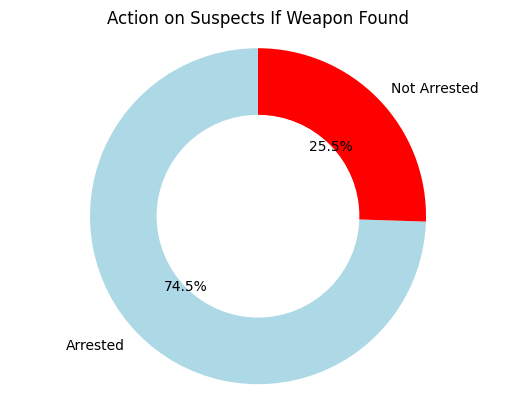

In [27]:
arrested_percent = (len(filtered_data_arrest_suspect) / total_incidents) * 100
not_arrested_percent = 100 - arrested_percent

labels = ['Arrested', 'Not Arrested']
sizes = [arrested_percent, not_arrested_percent]
colors = ['lightblue', 'red']

fig, ax = plt.subplots()
ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors, wedgeprops=dict(width=0.4))

# Draw a white circle to create a donut chart
centre_circle = plt.Circle((0, 0), 0.6, color='white', edgecolor='black', linewidth=0.8)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that the pie is drawn as a circle
ax.axis('equal')

plt.title('Action on Suspects If Weapon Found')
plt.show()

In [28]:
weapon_found_suspect_not_arrested_df = filtered_data_weapons_found[(filtered_data_weapons_found['SUSPECT_ARRESTED_FLAG'] == 'N')]
weapon_found_suspect_not_arrested_df.head()

,STOP_ID,STOP_FRISK_TIME,SUPERVISING_ACTION_CORRESPONDING_ACTIVITY_LOG_ENTRY_REVIEWED,SUSPECT_WEIGHT,STOP_LOCATION_SECTOR_CODE,STOP_LOCATION_STREET_NAME,STOP_DURATION_MINUTES,SUSPECT_SEX,ASK_FOR_CONSENT_FLG,STOP_LOCATION_X,...,ISSUING_OFFICER_RANK,OFFICER_EXPLAINED_STOP_FLAG,STOP_LOCATION_PRECINCT,SUSPECT_OTHER_DESCRIPTION,STOP_LOCATION_PATROL_BORO_NAME,STOP_LOCATION_BORO_NAME,YEAR2,SUSPECT_RACE_DESCRIPTION,STOP_FRISK_DATE,STOP_FRISK_HOUR
40,41,2023-12-07 01:00:00,Y,180,C,CROTONA PARK N,15,MALE,N,1014639,...,POM,Y,048,None,BRONX,BRONX,2021,BLACK,2021-01-01,1.0
50,51,2023-12-07 13:59:00,Y,160,A,AQUEDUCT AVE W,5,MALE,N,1011429,...,POM,Y,052,None,BRONX,BRONX,2021,BLACK,2021-01-06,13.0
91,92,2023-12-07 16:35:00,Y,150,E,WHITE PLAINS RD,3,MALE,Y,1021998,...,POM,Y,043,None,BRONX,BRONX,2021,None,2021-01-03,16.0
134,135,2023-12-07 22:55:00,Y,180,A,5 AVE,15,MALE,N,992313,...,POM,N,019,N/A,MANHATTAN,MANHATTAN,2021,BLACK,2021-01-12,22.0
135,136,2023-12-07 18:38:00,Y,180,A,PALADINO AVE,5,MALE,N,1003436,...,POM,Y,025,BLUE YANKEE CAP BLACK JACKET BLUE JEANS MULTI ...,MANHATTAN,MANHATTAN,2021,WHITE HISPANIC,2021-01-10,18.0


In [29]:
top_5_crimes = weapon_found_suspect_not_arrested_df.groupby(['SUSPECTED_CRIME_DESCRIPTION']).size().reset_index(name='count').nlargest(5, 'count')
top_5_crimes

,SUSPECTED_CRIME_DESCRIPTION,count
4,CPW,1340
0,ASSAULT,121
22,ROBBERY,111
15,MENACING,99
2,BURGLARY,64


In [30]:
weapon_found_suspect_not_arrested_df['SUSPECTED_CRIME_DESCRIPTION'].value_counts()

SUSPECTED_CRIME_DESCRIPTION
CPW                                            1340
ASSAULT                                         121
ROBBERY                                         111
MENACING                                         99
BURGLARY                                         64
OTHER                                            59
PETIT LARCENY                                    38
GRAND LARCENY AUTO                               27
RECKLESS ENDANGERMENT                            16
GRAND LARCENY                                    14
CRIMINAL TRESPASS                                13
CRIMINAL POSSESSION OF MARIHUANA                 12
CRIMINAL MISCHIEF                                 9
MURDER                                            6
AUTO STRIPPIG                                     5
UNAUTHORIZED USE OF A VEHICLE                     5
CRIMINAL SALE OF CONTROLLED SUBSTANCE             5
CRIMINAL POSSESSION OF CONTROLLED SUBSTANCE       4
CRIMINAL SALE OF MARIHUANA          

/var/folders/7b/79wqm1gs4qx4b_4mdnfyf4kh0000gn/T/ipykernel_67470/1123448509.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=top_5_crimes.index, y=top_5_crimes.values, palette="viridis")


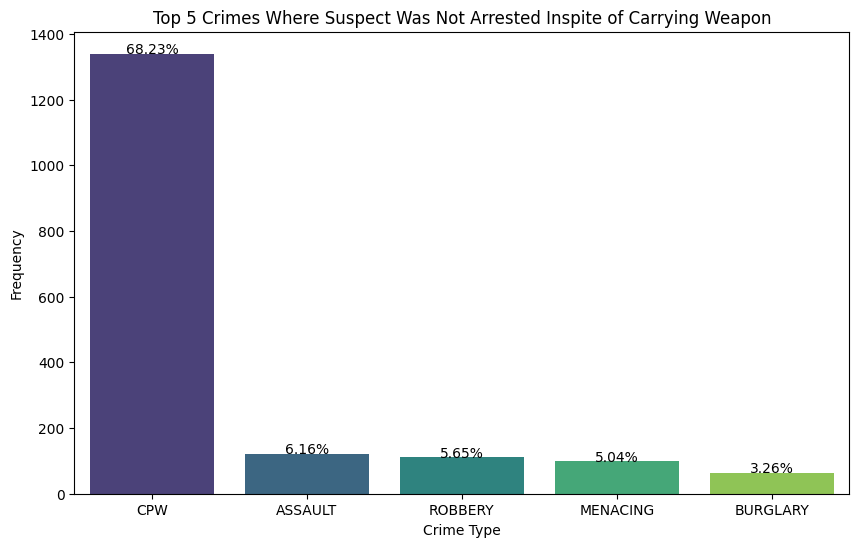

In [31]:
top_5_crimes = weapon_found_suspect_not_arrested_df['SUSPECTED_CRIME_DESCRIPTION'].value_counts().nlargest(5)
total_crimes = len(weapon_found_suspect_not_arrested_df)
percentages = (top_5_crimes / total_crimes) * 100
plt.figure(figsize=(10, 6))

ax = sns.barplot(x=top_5_crimes.index, y=top_5_crimes.values, palette="viridis")

for i, value in enumerate(percentages):
    ax.text(i, top_5_crimes[i] + 0.55, f'{value:.2f}%', ha='center')


plt.title('Top 5 Crimes Where Suspect Was Not Arrested Inspite of Carrying Weapon')
plt.xlabel('Crime Type')
plt.ylabel('Frequency')
plt.show()

/var/folders/7b/79wqm1gs4qx4b_4mdnfyf4kh0000gn/T/ipykernel_67470/1594134271.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=lowest_5_crimes.index, y=lowest_5_crimes.values, palette="viridis")


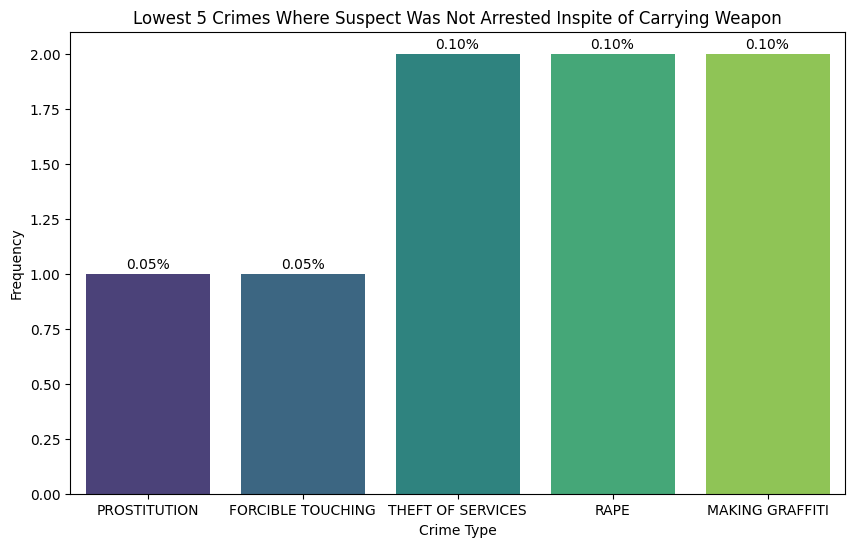

In [32]:
lowest_5_crimes = weapon_found_suspect_not_arrested_df['SUSPECTED_CRIME_DESCRIPTION'].value_counts().nsmallest(5)
total_crimes = len(weapon_found_suspect_not_arrested_df)
percentages = (lowest_5_crimes / total_crimes) * 100
plt.figure(figsize=(10, 6))

ax = sns.barplot(x=lowest_5_crimes.index, y=lowest_5_crimes.values, palette="viridis")

for i, value in enumerate(percentages):
    ax.text(i, lowest_5_crimes[i] + 0.025, f'{value:.2f}%', ha='center')


plt.title('Lowest 5 Crimes Where Suspect Was Not Arrested Inspite of Carrying Weapon')
plt.xlabel('Crime Type')
plt.ylabel('Frequency')
plt.show()

In [33]:
cpw_df = weapon_found_suspect_not_arrested_df[weapon_found_suspect_not_arrested_df['SUSPECTED_CRIME_DESCRIPTION']=='CPW']
cpw_df.head()

,STOP_ID,STOP_FRISK_TIME,SUPERVISING_ACTION_CORRESPONDING_ACTIVITY_LOG_ENTRY_REVIEWED,SUSPECT_WEIGHT,STOP_LOCATION_SECTOR_CODE,STOP_LOCATION_STREET_NAME,STOP_DURATION_MINUTES,SUSPECT_SEX,ASK_FOR_CONSENT_FLG,STOP_LOCATION_X,...,ISSUING_OFFICER_RANK,OFFICER_EXPLAINED_STOP_FLAG,STOP_LOCATION_PRECINCT,SUSPECT_OTHER_DESCRIPTION,STOP_LOCATION_PATROL_BORO_NAME,STOP_LOCATION_BORO_NAME,YEAR2,SUSPECT_RACE_DESCRIPTION,STOP_FRISK_DATE,STOP_FRISK_HOUR
40,41,2023-12-07 01:00:00,Y,180,C,CROTONA PARK N,15,MALE,N,1014639,...,POM,Y,048,None,BRONX,BRONX,2021,BLACK,2021-01-01,1.0
50,51,2023-12-07 13:59:00,Y,160,A,AQUEDUCT AVE W,5,MALE,N,1011429,...,POM,Y,052,None,BRONX,BRONX,2021,BLACK,2021-01-06,13.0
204,205,2023-12-07 23:20:00,N,None,A,139 ST,4,MALE,N,1036525,...,POF,Y,103,None,QUEENS,QUEENS,2021,BLACK,2021-01-15,23.0
503,504,2023-12-07 01:00:00,Y,None,A,WILLIAMS AVE,5,MALE,N,1013395,...,POM,Y,069,None,BROOKLYN,BROOKLYN,2021,BLACK,2021-01-25,1.0
516,517,2023-12-07 21:27:00,N,165,C,WATSON AVE,1,MALE,N,1017726,...,POM,Y,043,UNK,BRONX,BRONX,2021,BLACK,2021-01-30,21.0


/var/folders/7b/79wqm1gs4qx4b_4mdnfyf4kh0000gn/T/ipykernel_67470/3668462357.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=top_officers.index, y=top_officers.values, palette="viridis")


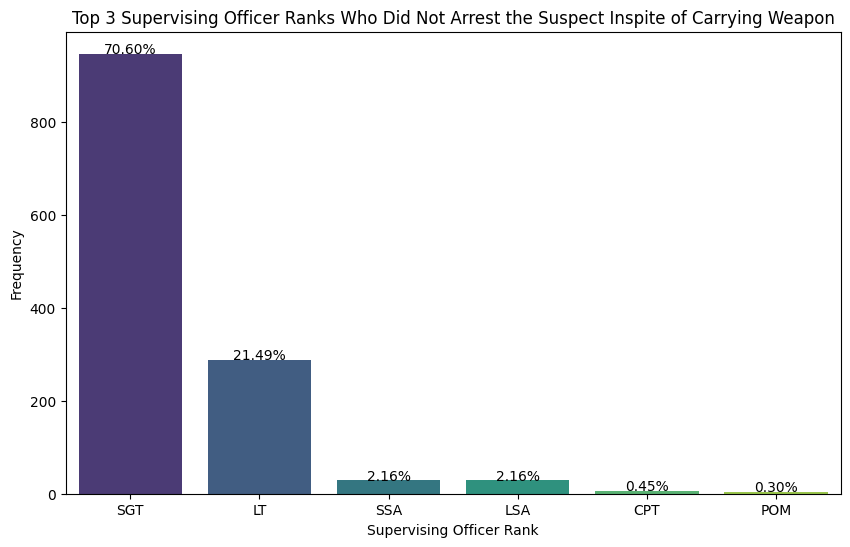

In [38]:

top_officers = cpw_df['SUPERVISING_OFFICER_RANK'].value_counts().nlargest(6)
total_left = len(cpw_df)
percentages = (top_officers / total_left) * 100
plt.figure(figsize=(10, 6))

ax = sns.barplot(x=top_officers.index, y=top_officers.values, palette="viridis")

for i, value in enumerate(percentages):
    ax.text(i, top_officers[i] + 0.55, f'{value:.2f}%', ha='center')


plt.title('Top 3 Supervising Officer Ranks Who Did Not Arrest the Suspect Inspite of Carrying Weapon')
plt.xlabel('Supervising Officer Rank')
plt.ylabel('Frequency')
plt.show()